<a href="https://colab.research.google.com/github/luananova/Transforming-Comics-into-Accessible-Audio-Narratives/blob/main/NOTEBOOKS/Spell_Bubble_Extracting_Texts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detecting the panels of a comic book page

In [ ]:
!pip install opencv-python

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

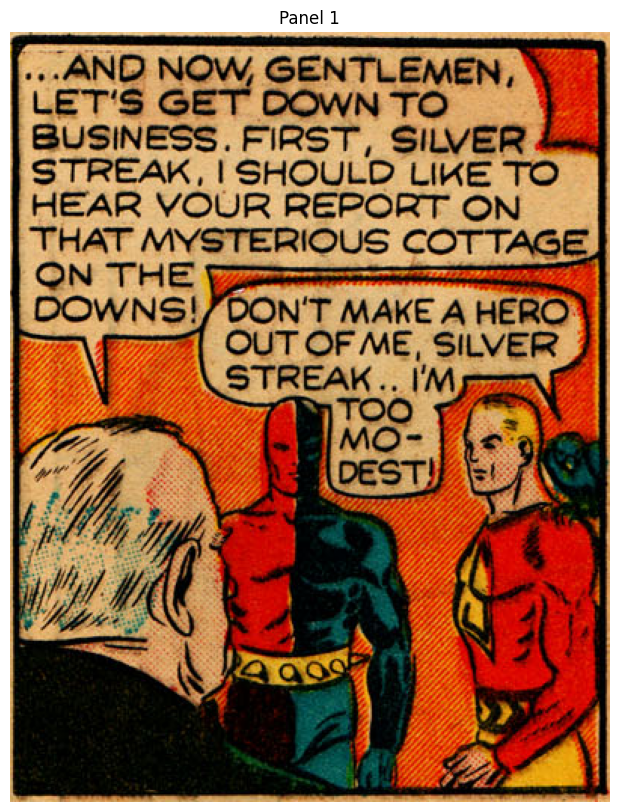

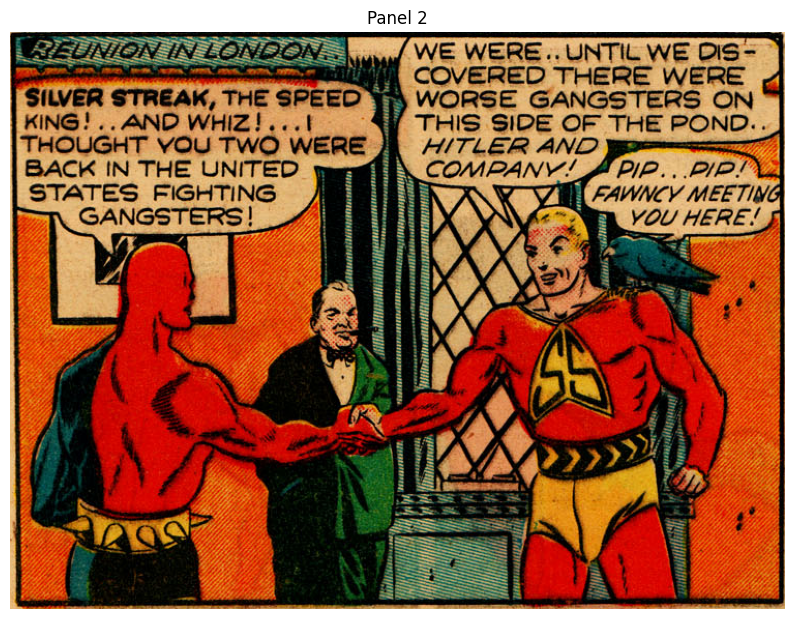

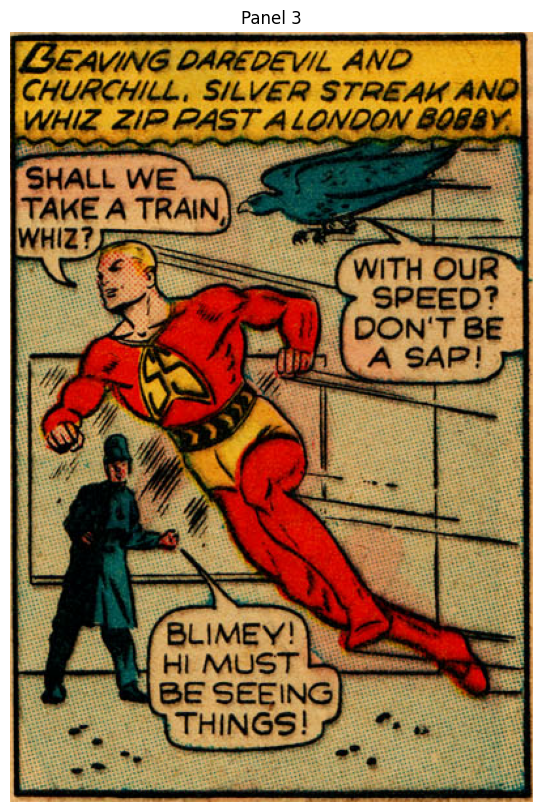

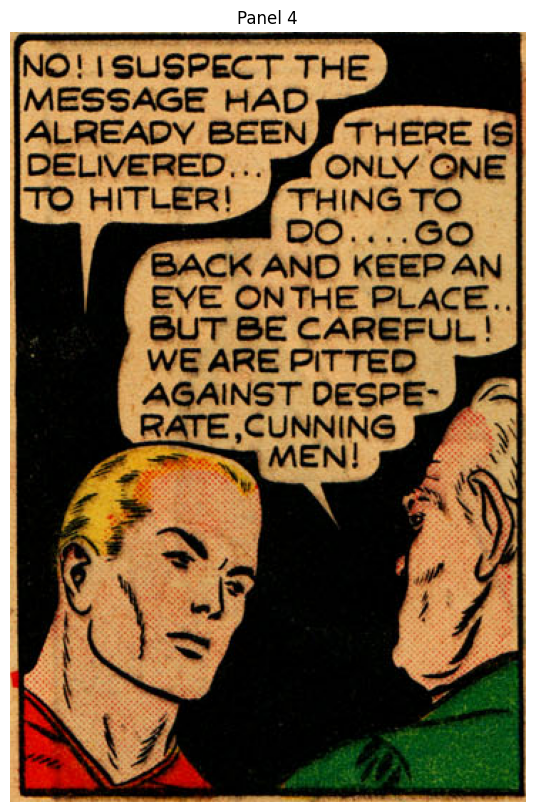

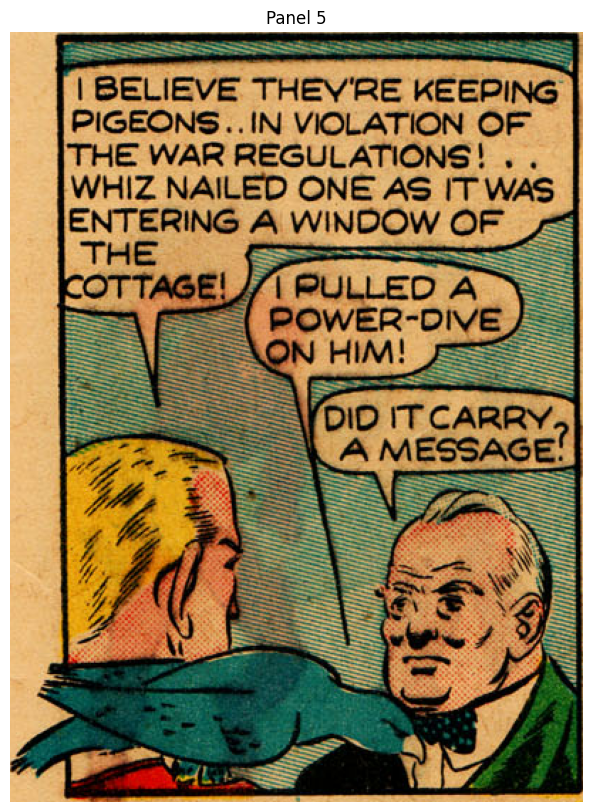

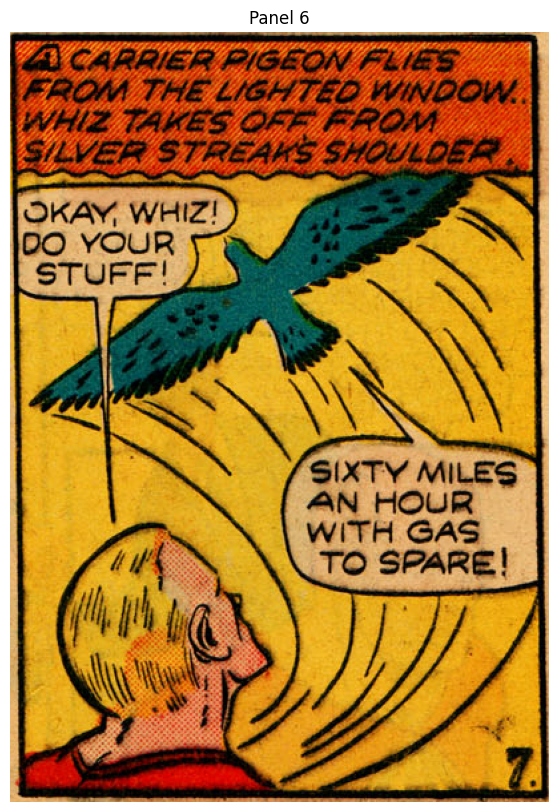

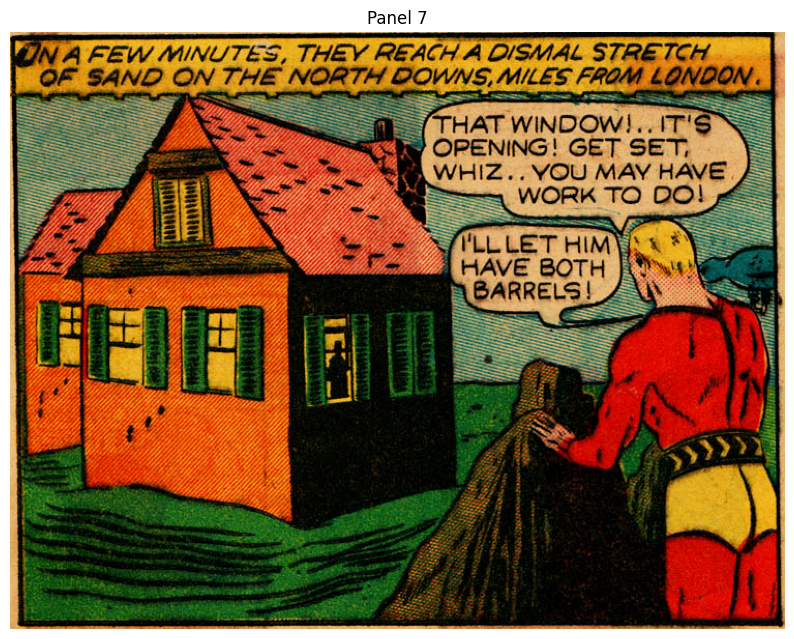

In [ ]:
# Load the image and convert to grayscale
image_path = '/content/Daredevil Battles Hitler 01 (1941) (c2c) (corn) p07.jpg'
image = cv2.imread(image_path, cv2.IMREAD_COLOR)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding
thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV,11,2)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours by area, assuming that too small panels are noise
contours = [c for c in contours if cv2.contourArea(c) > 5000]

# Sort contours by vertical position
contours = sorted(contours, key=lambda c: cv2.boundingRect(c)[1])

panels = []
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    panel = image[y:y+h, x:x+w]
    panels.append(panel)

# Show individual panels
for idx, panel in enumerate(panels, 1):
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(panel, cv2.COLOR_BGR2RGB))
    plt.title(f"Panel {idx}")
    plt.axis('off')
    plt.show()

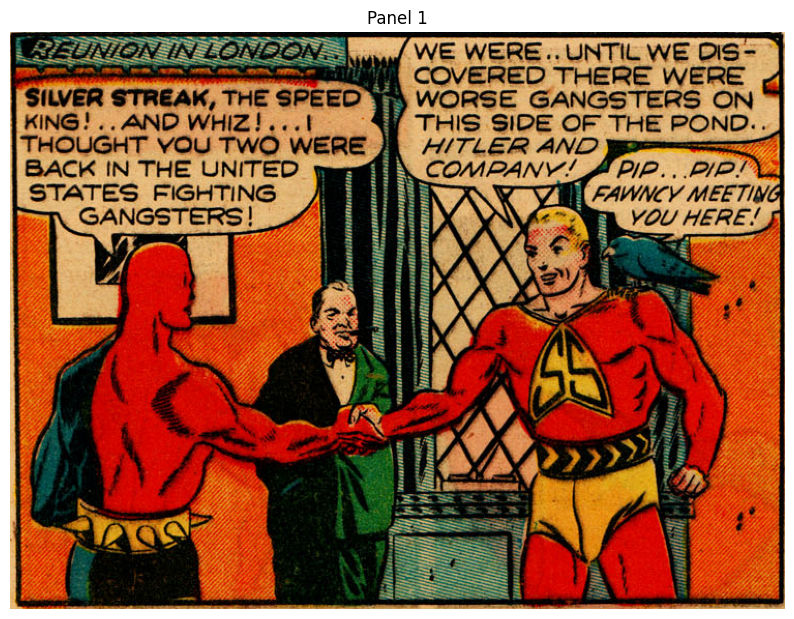

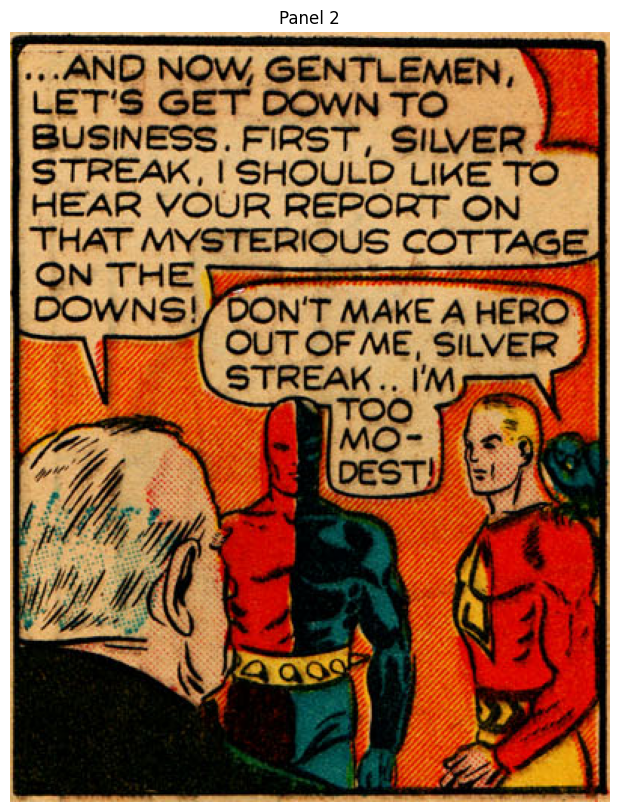

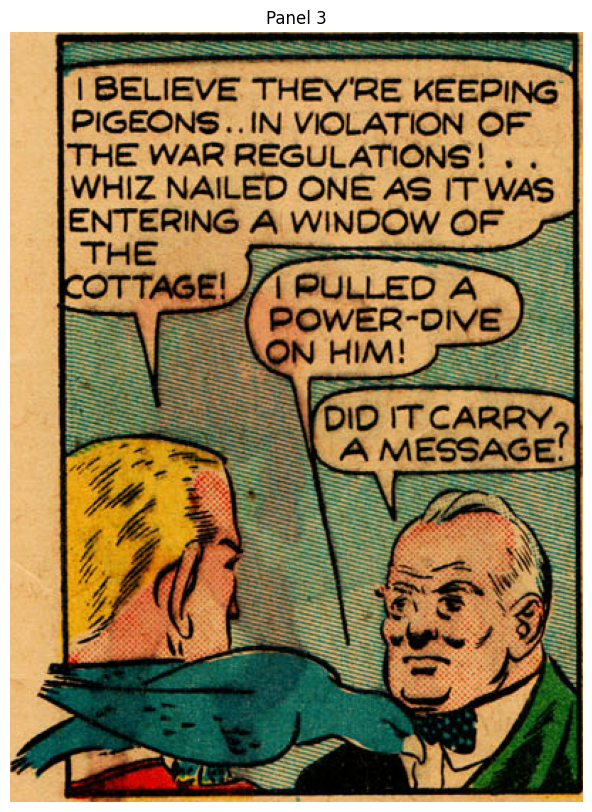

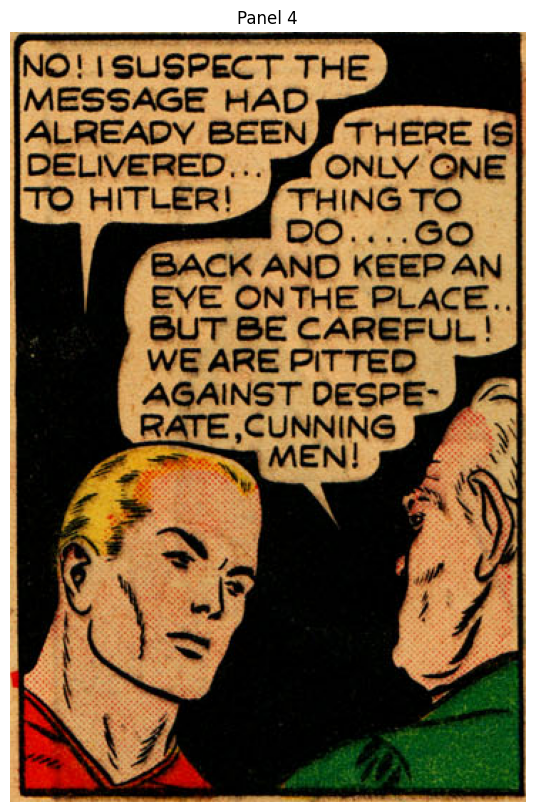

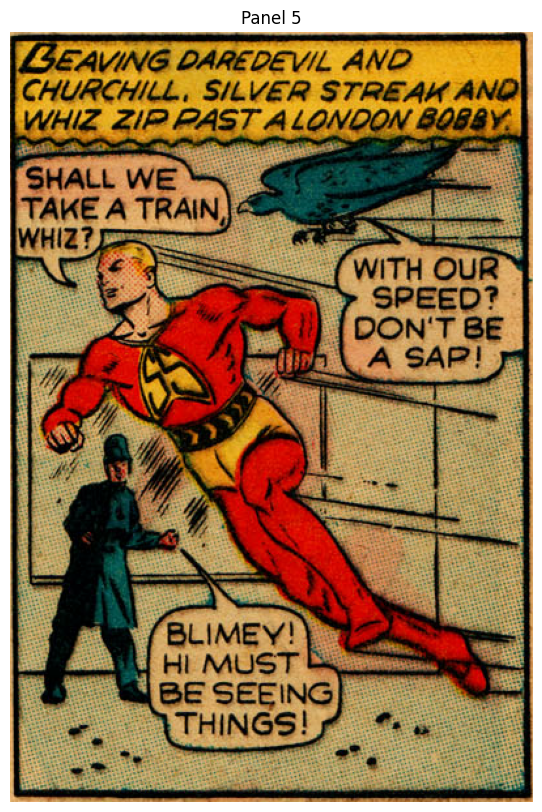

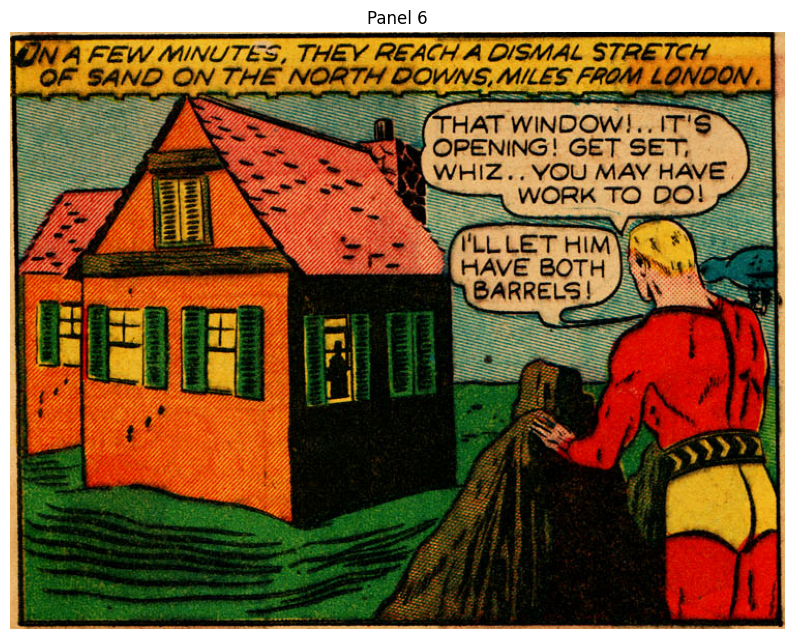

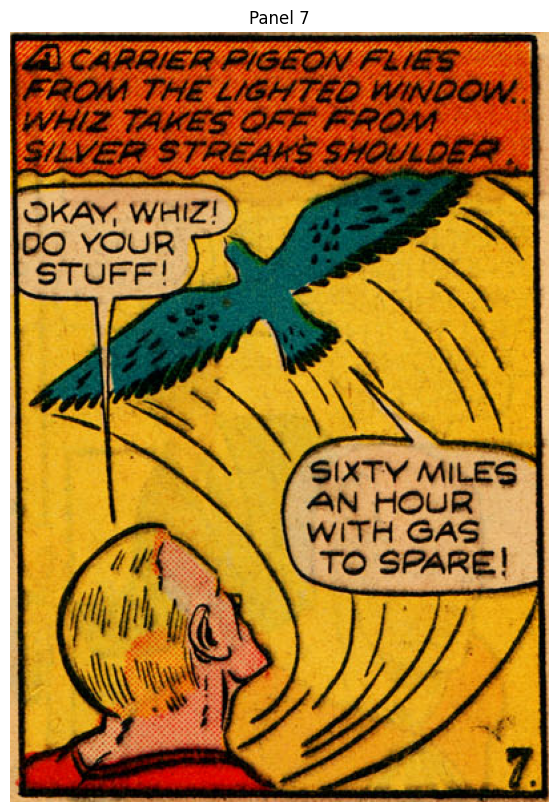

In [ ]:
def sort_panels(contours):
    # Sort contours by vertical position
    sorted_by_y = sorted(contours, key=lambda c: cv2.boundingRect(c)[1])

    # Group panels in the same "line"
    lines = []
    line = []
    prev_y = 0

    for contour in sorted_by_y:
        _, y, _, _ = cv2.boundingRect(contour)

        if not line or abs(y - prev_y) < 50:  # The value of 50 can be adjusted as necessary
            line.append(contour)
        else:
            lines.append(sorted(line, key=lambda c: cv2.boundingRect(c)[0]))  # Sort by horizontal position
            line = [contour]

        prev_y = y

    # Add the last line if it is not empty
    if line:
        lines.append(sorted(line, key=lambda c: cv2.boundingRect(c)[0]))

    # Flatten the list of lines
    sorted_contours = [contour for line in lines for contour in line]

    return sorted_contours

# Apply the sorting function
sorted_contours = sort_panels(contours)

panels = []
for contour in sorted_contours:
    x, y, w, h = cv2.boundingRect(contour)
    panel = image[y:y+h, x:x+w]
    panels.append(panel)

# Show individual panels
for idx, panel in enumerate(panels, 1):
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(panel, cv2.COLOR_BGR2RGB))
    plt.title(f"Panel {idx}")
    plt.axis('off')
    plt.show()

# Detecting and extracting the texts from the panels with OCR

In [ ]:
!pip install --upgrade google-cloud-vision

In [ ]:
from google.colab import files
import os

# Request the upload of the credentials file
uploaded_files = files.upload()

In [ ]:
# Replace 'your_file_name.json' with the name of the file you uploaded

os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = 'your_file_name.json'

In [ ]:
from google.cloud import vision

def extract_text_from_image_with_vision(img):
    # Start the client
    client = vision.ImageAnnotatorClient()

    # Convert the image to bytes
    _, encoded_image = cv2.imencode('.png', img)
    image_content = encoded_image.tobytes()
    image = vision.Image(content=image_content)

    # Request text detection
    response = client.text_detection(image=image)
    texts = response.text_annotations

    # Return the main text
    return texts[0].description if texts else ""

# Testing...
for idx, panel in enumerate(panels, 1):
    extracted_text = extract_text_from_image_with_vision(panel)
    print(f"Text from Panel {idx}:\n")
    print(extracted_text)
    print("-" * 50)

Text from Panel 1:

REUNION IN LONDON
SILVER STREAK, THE SPEED
KING!..AND WHIZ!...l
THOUGHT YOU TWO WERE
BACK IN THE UNITED
STATES FIGHTING
GANGSTERS!
Lego
Manil
WE WERE.. UNTIL WE DIS-
COVERED THERE WERE
WORSE GANGSTERS ON
THIS SIDE OF THE POND...
HITLER AND
COMPANY! PIP...PIP!
milimen
Mituumenits
FAWNCY MEETING
YOU HERE!
Hami admi
--------------------------------------------------
Text from Panel 2:

...AND NOW, GENTLEMEN,
LET'S GET DOWN TO
BUSINESS. FIRST, SILVER
STREAK, I SHOULD LIKE TO
HEAR YOUR REPORT ON
THAT MYSTERIOUS COTTAGE
ON THE
DOWNS!
DON'T MAKE A HERO
OUT OF ME, SILVER
STREAK.. I'M
TOO
MO-
DEST
--------------------------------------------------
Text from Panel 3:

I BELIEVE THEY'RE KEEPING
PIGEONS.. IN VIOLATION OF
THE WAR REGULATIONS!..
WHIZ NAILED ONE AS IT WAS
ENTERING A WINDOW OF
THE
COTTAGE!
1 PULLED A
POWER-DIVE
ON HIM!
DID IT CARRY,
A MESSAGE!
--------------------------------------------------
Text from Panel 4:

NO! I SUSPECT THE
MESSAGE HAD
ALREADY BEEN THERE IS


In [ ]:
def extract_text_from_specific_panel(panel):
    height, width, _ = panel.shape

    # Splitting the panel into two halves: upper and lower
    upper_half = panel[0:height//2, :]
    lower_half = panel[height//2:, :]

    # Extract text from both halves
    upper_text = extract_text_from_image_with_vision(upper_half)
    lower_text = extract_text_from_image_with_vision(lower_half)

    # Combine and return the text
    return upper_text + "\n" + lower_text

# To test:
for idx, panel in enumerate(panels, 1):
    if idx == 5:  # If it is panel 5
        extracted_text = extract_text_from_specific_panel(panel)
    else:
        extracted_text = extract_text_from_image_with_vision(panel)

    print(f"Text from Panel {idx}:\n")
    print(extracted_text)

Text from Panel 1:

REUNION IN LONDON
SILVER STREAK, THE SPEED
KING!..AND WHIZ!...l
THOUGHT YOU TWO WERE
BACK IN THE UNITED
STATES FIGHTING
GANGSTERS!
Lego
Manil
WE WERE.. UNTIL WE DIS-
COVERED THERE WERE
WORSE GANGSTERS ON
THIS SIDE OF THE POND...
HITLER AND
COMPANY! PIP...PIP!
milimen
Mituumenits
FAWNCY MEETING
YOU HERE!
Hami admi
Text from Panel 2:

...AND NOW, GENTLEMEN,
LET'S GET DOWN TO
BUSINESS. FIRST, SILVER
STREAK, I SHOULD LIKE TO
HEAR YOUR REPORT ON
THAT MYSTERIOUS COTTAGE
ON THE
DOWNS!
DON'T MAKE A HERO
OUT OF ME, SILVER
STREAK.. I'M
TOO
MO-
DEST
Text from Panel 3:

I BELIEVE THEY'RE KEEPING
PIGEONS.. IN VIOLATION OF
THE WAR REGULATIONS!..
WHIZ NAILED ONE AS IT WAS
ENTERING A WINDOW OF
THE
COTTAGE!
1 PULLED A
POWER-DIVE
ON HIM!
DID IT CARRY,
A MESSAGE!
Text from Panel 4:

NO! I SUSPECT THE
MESSAGE HAD
ALREADY BEEN THERE IS
DELIVERED...
TO HITLER!
ONLY ONE
THING TO
DO....GO
BACK AND KEEP AN
EYE ON THE PLACE..
BUT BE CAREFUL!
WE ARE PITTED
AGAINST DESPE
RATE,CUNNING
MEN!
Text

# Extracting texts from balloons

In [ ]:
def expand_contour(contour, expansion_pixels=10):
    """Expande um contorno dada uma quantidade de pixels."""
    moments = cv2.moments(contour)
    if moments["m00"] == 0:
        return contour
    cx = int(moments["m10"] / moments["m00"])
    cy = int(moments["m01"] / moments["m00"])

    expanded_contour = []
    for point in contour:
        dx = point[0][0] - cx
        dy = point[0][1] - cy
        new_point = [(dx * (1 + expansion_pixels / 100.0)) + cx,
                     (dy * (1 + expansion_pixels / 100.0)) + cy]
        expanded_contour.append([new_point])

    return np.array(expanded_contour, dtype=np.int32)

def extract_balloon_texts_refined(panel_img):
    # Convert the image to grayscale
    gray = cv2.cvtColor(panel_img, cv2.COLOR_BGR2GRAY)

    # Binarize with a suitable threshold to separate white balloons from the black background
    _, binary = cv2.threshold(gray, 71, 255, cv2.THRESH_BINARY)

    # Morphological operations to remove small imperfections and connect nearby areas
    kernel = np.ones((2,2), np.uint8)
    cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # Apply dilation to expand balloons and then erosion to separate them if they are too close
    dilated = cv2.dilate(cleaned, kernel, iterations=1)
    eroded = cv2.erode(dilated, kernel, iterations=1)

    cleaned = cv2.morphologyEx(eroded, cv2.MORPH_CLOSE, kernel)

    # Detect contours in the binarized image
    contours, _ = cv2.findContours(cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours by a weighted combination of vertical and horizontal position
    weight_for_vertical_position = 0.7  # Adjust this value as necessary
    contours = sorted(contours, key=lambda x: (weight_for_vertical_position * cv2.boundingRect(x)[1] + (1 - weight_for_vertical_position) * cv2.boundingRect(x)[0]))

    balloon_texts = []

    for contour in contours:
        # Filter contours by area to discard small regions
        if cv2.contourArea(contour) < 1000:
            continue

        # Expand the contour
        expanded = expand_contour(contour, expansion_pixels=13.3)

        # Create a mask for each expanded contour/balloon
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [expanded], -1, (255), thickness=cv2.FILLED)

        # Apply the mask to the original image to obtain the balloon region
        balloon_region = cv2.bitwise_and(panel_img, panel_img, mask=mask)

        # Extract the text from the balloon region
        balloon_text = extract_text_from_image_with_vision(balloon_region)
        balloon_texts.append(balloon_text.strip())

    return balloon_texts

# Testing the function
panel_4_balloon_texts = extract_balloon_texts_refined(panels[0])
for text in panel_4_balloon_texts:
    print(text)
    print("-" * 50)


--------------------------------------------------
REUNION IN LONDON.
--------------------------------------------------
SILVER STREAK, THE SPEED
KING!..AND WHIZ!...l
THOUGHT YOU TWO WERE
BACK IN THE UNITED
STATES FIGHTING
GANGSTERS!
innan
--------------------------------------------------

--------------------------------------------------
allan
WE WERE.. UNTIL WE DIS-
COVERED THERE WERE
WORSE GANGSTERS ON
THIS SIDE OF THE POND...
HITLER AND
COMPANY!
--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------
mmmmm
--------------------------------------------------
PIP...PIP!
FAWNCY MEETING
YOU HERE!
--------------------------------------------------

--------------------------------------------------
aga
--------------------------------

In [ ]:
def display_texts_from_all_panels(panels):
    for idx, panel in enumerate(panels):
        balloon_texts = extract_balloon_texts_refined(panel)
        print(f"Texts from Panel {idx + 1}:\n")
        for text in balloon_texts:
            print(text)
            print("-" * 50)

# Using the function to display texts from all panels
display_texts_from_all_panels(panels)

Texts from Panel 1:


--------------------------------------------------
REUNION IN LONDON.
--------------------------------------------------
SILVER STREAK, THE SPEED
KING!..AND WHIZ!...l
THOUGHT YOU TWO WERE
BACK IN THE UNITED
STATES FIGHTING
GANGSTERS!
innan
--------------------------------------------------

--------------------------------------------------
allan
WE WERE.. UNTIL WE DIS-
COVERED THERE WERE
WORSE GANGSTERS ON
THIS SIDE OF THE POND...
HITLER AND
COMPANY!
--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------
mmmmm
--------------------------------------------------
PIP...PIP!
FAWNCY MEETING
YOU HERE!
--------------------------------------------------

--------------------------------------------------
aga
-----------

# Post-processing the balloon texts with NLP

In [ ]:
pip install spacy

In [ ]:
import spacy

# Load the English language model from spaCy
nlp = spacy.load('en_core_web_sm')

def score_sentence(sentence):
    # This function returns a "score" for the sentence based on the token probabilities
    doc = nlp(sentence)
    return sum(token.prob for token in doc)

def post_process_text(text):
    # Disregard lowercase words
    words = text.split()
    words = [word for word in words if word.isupper()]

    # Converting "1" to "I" based on context
    for i, word in enumerate(words):
        if word == '1':
            with_one = ' '.join(words)
            with_i = ' '.join(words[:i] + ['I'] + words[i+1:])
            if score_sentence(with_i) > score_sentence(with_one):
                words[i] = 'I'

    # List of "bad elements" to be removed when they appear isolated
    bad_elements = ['AUTO', 'EIB', '1500600000', ')']

    # Removing "bad elements" that appear isolated
    cleaned_words = []
    i = 0
    while i < len(words):
        word = words[i]
        # Special case for "PAST AL"
        if i < len(words) - 1 and words[i] == "PAST" and words[i+1] == "AL":
            i += 2
            continue
        elif word in bad_elements:
            # Check if the element appears isolated
            is_isolated = (i == 0 or words[i-1] not in bad_elements) and (i == len(words)-1 or words[i+1] not in bad_elements)
            if is_isolated:
                i += 1
                continue
        cleaned_words.append(word)
        i += 1

    # Reconstructing the sentence after cleanup
    cleaned_text = ' '.join(cleaned_words)

    return cleaned_text

def display_texts_from_all_panels(panels):
    for idx, panel in enumerate(panels):
        balloon_texts = extract_balloon_texts_refined(panel)
        print(f"Texts from Panel {idx + 1}:\n")
        for text in balloon_texts:
            # Apply post-processing to the text
            corrected_text = post_process_text(text)
            print(corrected_text)
            print("-" * 50)

# Using the function to display texts from all panels
display_texts_from_all_panels(panels)

Texts from Panel 1:


--------------------------------------------------
REUNION IN LONDON.
--------------------------------------------------
SILVER STREAK, THE SPEED KING!..AND THOUGHT YOU TWO WERE BACK IN THE UNITED STATES FIGHTING GANGSTERS!
--------------------------------------------------

--------------------------------------------------
WE WERE.. UNTIL WE DIS- COVERED THERE WERE WORSE GANGSTERS ON THIS SIDE OF THE POND... HITLER AND COMPANY!
--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------

--------------------------------------------------
PIP...PIP! FAWNCY MEETING YOU HERE!
--------------------------------------------------

--------------------------------------------------

-----------------------------------------

In [ ]:
import re

def space_after_punctuation(text):
    # 1. Add a space after any punctuation sequence.
    text = re.sub(r'([!?,;:.]+)([^\s])', r'\1 \2', text)

    # 2. Keep sequences of consecutive punctuations together and insert a space after them.
    text = re.sub(r'([!?,;:.]+)\s+([!?,;:.]+)', r'\1\2 ', text)

    return text

def should_convert_to_I(current_word, next_word):
    # Create a test sentence
    test_sentence = f"I {next_word}"
    doc = nlp(test_sentence)

    # Look for a token that is "I"
    for token in doc:
        if token.text == "I" and token.dep_ in ['nsubj', 'nsubjpass']:
            return True
    return False

def merge_broken_words(words):
    i = 0
    while i < len(words) - 1:
        if words[i].endswith('-'):
            # Join the word that ends with a hyphen to the next word
            merged_word = words[i][:-1] + words[i+1]
            words[i] = merged_word
            # Remove the next word, which now is part of the previous word
            words.pop(i+1)
        else:
            i += 1
    return words

def post_process_text(text):
    # Ensure space after punctuation
    text = space_after_punctuation(text)

    # Splitting the text into words
    words = text.split()

    # Converting "1" or "l" to "I" if followed by a verb or if determined by context
    for i in range(len(words) - 1):
        if words[i] in ['1', 'l'] and should_convert_to_I(words[i], words[i+1]):
            words[i] = 'I'

    # Join words broken by a hyphen
    words = merge_broken_words(words)

    # Now disregard lowercase words
    words_upper = [word for word in words if word.isupper()]

    # List of "bad elements" to be removed when they appear isolated
    bad_elements = ['EIB', '1500600000', ')']

    # Removing "bad elements" that appear isolated
    cleaned_words = []
    i = 0
    while i < len(words_upper):
        word = words_upper[i]

        # Special case for "PAST AL"
        if i < len(words_upper) - 1 and words_upper[i] == "PAST" and words_upper[i+1] == "AL":
            i += 2
            continue

        # Special case for "I AUTO"
        elif i < len(words_upper) - 1 and words_upper[i] == "I" and words_upper[i+1] == "AUTO":
            i += 2
            continue

        elif word in bad_elements:
        # Check if the element appears isolated
            is_isolated = (i == 0 or words_upper[i-1] not in bad_elements) and (i == len(words_upper)-1 or words_upper[i+1] not in bad_elements)
            if is_isolated:
                i += 1
                continue

        cleaned_words.append(word)
        i += 1

    # Reconstructing the sentence after cleanup
    cleaned_text = ' '.join(cleaned_words)

    return cleaned_text

def get_texts_from_all_panels(panels):
    all_texts = []
    for idx, panel in enumerate(panels):
        balloon_texts = extract_balloon_texts_refined(panel)
        for text in balloon_texts:
            corrected_text = post_process_text(text)
            all_texts.append(corrected_text)
    return all_texts

# Saving the texts in a list
corrected_texts = get_texts_from_all_panels(panels)

In [ ]:
corrected_texts

['',
 'REUNION IN LONDON.',
 'SILVER STREAK, THE SPEED KING!.. AND WHIZ!... I THOUGHT YOU TWO WERE BACK IN THE UNITED STATES FIGHTING GANGSTERS!',
 '',
 'WE WERE.. UNTIL WE DISCOVERED THERE WERE WORSE GANGSTERS ON THIS SIDE OF THE POND... HITLER AND COMPANY!',
 '',
 '',
 '',
 '',
 '',
 '',
 'PIP... PIP! FAWNCY MEETING YOU HERE!',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 "AND NOW, GENTLEMEN, LET'S GET DOWN TO BUSINESS. FIRST, SILVER STREAK, I SHOULD LIKE TO HEAR YOUR REPORT ON THAT MYSTERIOUS COTTAGE ON THE DOWNS!",
 '',
 '',
 '',
 "ON'T MAKE A HERO OUT OF ME, SILVER STREAK.. I'M TOO MODEST",
 '',
 '',
 '',
 '',
 "I BELIEVE THEY'RE KEEPING PIGEONS.. IN VIOLATION OF THE WAR REGULATIONS!.. WHIZ NAILED ONE AS IT WAS ENTERING A WINDOW OF THE COTTAGE!",
 '',
 '',
 'I PULLED A POWER-DIVE ON HIM!',
 'DID IT CARRY A MESSAGE!',
 '',
 '',
 '',
 'NO! I SUSPECT THE MESSAGE HAD ALREADY BEEN DELIVERED... TO HITLER!',
 'THERE IS ONLY ONE THING TO DO.... GO BACK AND KEEP AN EYE ON THE PLACE.. BUT BE CAREFUL

In [ ]:
import json

def capitalize_after_punctuation(text):
    # List of proper names that should always be capitalized
    proper_names = ["Silver Streak", "Whiz", "Daredevil"]

    # Capitalize the first letter of each sentence, but not after commas
    split_punctuation = r'([!?.]+) '  # Comma is not included here
    sentences = re.split(split_punctuation, text)
    capitalized_sentences = [sentences[0].capitalize()]

    for i in range(1, len(sentences), 2):
        capitalized_sentences.append(sentences[i] + ' ')
        capitalized_sentences.append(sentences[i+1].capitalize())

    # Join everything into a single string
    text = ''.join(capitalized_sentences)

    # Ensure that proper names are capitalized
    for name in proper_names:
        # Create a regex pattern that ignores capitalization
        pattern = re.compile(name, re.IGNORECASE)
        # Replace all found occurrences with the correctly capitalized name
        text = pattern.sub(name, text)

    return text

def display_texts_from_all_panels(panels):
    all_texts = {}  # Dictionary to store the texts from all panels
    for idx, panel in enumerate(panels):
        balloon_texts = extract_balloon_texts_refined(panel)

        print(f"Painel {idx + 1}:\n")
        balloon_idx = 1

        for text in balloon_texts:
            corrected_text = post_process_text(text)
            if corrected_text:  # Only display if there is text
                # Capitalize the first letter of each sentence after correction
                corrected_text = capitalize_after_punctuation(corrected_text)

                print(f"Balão {balloon_idx}:\n{corrected_text}\n")
                print("-" * 50)
                balloon_idx += 1

                # Store the text in the dictionary with a unique key (e.g., "Panel1_Balloon1")
                key = f"Panel{idx + 1}_Balloon{balloon_idx - 1}"
                all_texts[key] = corrected_text

    # Save the texts in a JSON file
    with open("textos.json", "w") as json_file:
        json.dump(all_texts, json_file, ensure_ascii=False, indent=4)

# Displaying the texts from all panels and saving in texts.json
display_texts_from_all_panels(panels)

Painel 1:

Balão 1:
Reunion in london.

--------------------------------------------------
Balão 2:
Silver Streak, the speed king!.. And Whiz!... I thought you two were back in the united states fighting gangsters!

--------------------------------------------------
Balão 3:
We were.. Until we discovered there were worse gangsters on this side of the pond... Hitler and company!

--------------------------------------------------
Balão 4:
Pip... Pip! Fawncy meeting you here!

--------------------------------------------------
Painel 2:

Balão 1:
And now, gentlemen, let's get down to business. First, Silver Streak, i should like to hear your report on that mysterious cottage on the downs!

--------------------------------------------------
Balão 2:
On't make a hero out of me, Silver Streak.. I'm too modest

--------------------------------------------------
Painel 3:

Balão 1:
I believe they're keeping pigeons.. In violation of the war regulations!.. Whiz nailed one as it was entering a 

# Context-based corrections with GPT

In [ ]:
pip install openai==0.28

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 3.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.


In [ ]:
import openai
import json
import getpass

def load_corrections(filename='corrections.json'):
    try:
        with open(filename, 'r') as file:
            return json.load(file)
    except FileNotFoundError:
        return {}  # Returns an empty dictionary if the file does not exist

# Set up the OpenAI API key using getpass
api_key = getpass.getpass("Enter your OpenAI API key: ")

Enter your OpenAI API key: ··········


In [ ]:
openai.api_key = api_key

# Function to load the 'corrections.json' file if it exists, otherwise loads 'texts.json'
def load_data(filename='corrections.json', default_filename='textos.json'):
    try:
        with open(filename, 'r') as file:
            return json.load(file)
    except FileNotFoundError:
        # If 'corrections.json' does not exist, tries to load 'texts.json'
        try:
            with open(default_filename, 'r') as text_file:
                text_data = json.load(text_file)
                return text_data
        except FileNotFoundError:
            return {}

# Initializes the corrections dictionary
corrections = load_corrections()

# Initializes the texts file
text_data = load_data(default_filename='textos.json')

# Function to save corrections in a JSON file
def save_corrections(corrections, filename='corrections.json'):
    with open(filename, 'w') as file:
        json.dump(corrections, file)
        print(f"Arquivo '{filename}' salvo com sucesso!")

def correct_text_with_gpt(text, base_prompt):
    # Makes the API call
    full_prompt = f"{base_prompt}\n\nText to correct:\n{text}\n"
    response = openai.Completion.create(
        model="text-davinci-003",
        prompt=full_prompt,
        temperature=0.2,
        max_tokens=1000  # To adjust as necessary
    )
    corrected_text = response.choices[0].text.strip()

    return corrected_text

# Defining the list of proper names and expressions and the base prompt outside the loop
proper_names = ["Silver Streak", "Whiz", "Daredevil"]
proper_names_list = ', '.join([f"'{name}'" for name in proper_names])

base_prompt = (
    "Please correct the following text with these guidelines in mind:\n\n"
    "1. Do not hallucinate. Do not add sentences, words, letters or punctuation that were not in the original text, unless I ask for it in the following prompts.\n"
    "2. Do not correct sentences, words, letters, punctuation or any other grammar construction, unless I ask for the adjustment in the following prompts.\n"
    "3. Add only missing initial or final letters to words where the context makes it clear what the intended word should be.\n"
    "4. Maintain the word Fawncy with this spelling, do not correct it. Do not add the word where it doesn't exist.\n"
    "5. Do not add quotation marks around any correction or mispelling word.\n"
    "6. Preserve the capitalization that has already been corrected. Capitalize only proper names that are evidently missing capitalization and are not at the beginning of a sentence. Refrain from altering the capitalization of names on this list: {proper_names_list}.\n"
    "7. Keep the original spacing after punctuation, including ellipses and repeated punctuation marks. Do not add new commas within sentences, only keep the originals.\n"
    "8. Maintain hyphens in compound words where they are commonly found. Do not add hyphens that were removed due to incorrect line breaks in the original text.\n"
    "9. Do not alter sentences that already have terminal punctuation unless it clearly does not match the tone or intention of the sentence.\n"
    "10. Add terminal punctuation only if a sentence clearly lacks it and the intended tone can be deduced. Only use exclamation mark if the sentence express strong emotion or give a command.\n"
    "11. Preserve the original text without assuming errors, unless the errors were pointed in the past ten prompts.\n\n"
)

def display_texts_from_all_panels(panels):
    corrected_texts = []  # List to store the corrected texts

    for idx, panel in enumerate(panels):
        balloon_texts = extract_balloon_texts_refined(panel)
        print(f"Painel {idx + 1}:\n")
        balloon_idx = 1

        for text in balloon_texts:
            corrected_text = post_process_text(text)
            if corrected_text:  # Only display if there is text
                corrected_text = capitalize_after_punctuation(corrected_text)
                corrected_text = corrected_text.replace('Beaving', 'Leaving')

                # Sending the text for correction
                corrected_text_with_gpt = correct_text_with_gpt(corrected_text, base_prompt)

                corrected_texts.append(corrected_text_with_gpt)  # Add the corrected text to the list

                print(f"Balão {balloon_idx}:\n{corrected_text_with_gpt}\n")
                print("-" * 50)

                balloon_idx += 1

    # Saves all corrected texts in the 'corrections.json' file
    save_corrections(corrected_texts, filename='corrections.json')

# Calls the function to display the texts of the balloons
display_texts_from_all_panels(panels)

Painel 1:

Balão 1:
Reunion in London.

--------------------------------------------------
Balão 2:
Silver Streak, the speed king!.. And Whiz!... I thought you two were back in the United States fighting gangsters!

--------------------------------------------------
Balão 3:
We were... Until we discovered there were worse gangsters on this side of the pond... Hitler and company!

--------------------------------------------------
Balão 4:
Pip... Pip! Fawncy meeting you here!

--------------------------------------------------
Painel 2:

Balão 1:
And now, gentlemen, let's get down to business. First, Silver Streak, I should like to hear your report on that mysterious cottage on the downs!

--------------------------------------------------
Balão 2:
Don't make a hero out of me, Silver Streak... I'm too modest.

--------------------------------------------------
Painel 3:

Balão 1:
I believe they're keeping pigeons in violation of the war regulations! Whiz nailed one as it was entering a 

# Associating the texts with the characters



In [ ]:
def get_balloon_center(contour):
    moments = cv2.moments(contour)
    if moments["m00"] == 0:
        return None
    cx = int(moments["m10"] / moments["m00"])
    cy = int(moments["m01"] / moments["m00"])
    return (cx, cy)

def extract_balloon_centers(panel_img):
    # Convert the image to grayscale
    gray = cv2.cvtColor(panel_img, cv2.COLOR_BGR2GRAY)

    # Binarize with a suitable threshold to separate white balloons from the black background
    _, binary = cv2.threshold(gray, 71, 255, cv2.THRESH_BINARY)

    # Morphological operations to remove small imperfections and connect nearby areas
    kernel = np.ones((2,2), np.uint8)
    cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    # Apply dilation to expand balloons and then erosion to separate them if they are too close
    dilated = cv2.dilate(cleaned, kernel, iterations=1)
    eroded = cv2.erode(dilated, kernel, iterations=1)

    cleaned = cv2.morphologyEx(eroded, cv2.MORPH_CLOSE, kernel)

    # Detect contours in the binarized image
    contours, _ = cv2.findContours(cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Sort contours by a weighted combination of vertical and horizontal position
    weight_for_vertical_position = 0.7  # Adjust this value as necessary
    contours = sorted(contours, key=lambda x: (weight_for_vertical_position * cv2.boundingRect(x)[1] + (1 - weight_for_vertical_position) * cv2.boundingRect(x)[0]))

    balloon_centers = []

    for contour in contours:
        # Filter contours by area to discard small regions
        if cv2.contourArea(contour) < 1000:
            continue

        # Expand the contour
        expanded = expand_contour(contour, expansion_pixels=13.3)

        # Create a mask for each expanded contour/balloon
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [expanded], -1, (255), thickness=cv2.FILLED)

        # Apply the mask to the original image to obtain the balloon region
        balloon_region = cv2.bitwise_and(panel_img, panel_img, mask=mask)

        # Add the coordinates of the balloon's center
        balloon_center = get_balloon_center(expanded)
        if balloon_center:
            balloon_centers.append(balloon_center)

    return balloon_centers

In [ ]:
# Request the upload of the Annotations file - From the "Identifying Characters" Notebook
uploaded_files = files.upload()

Saving anotacoes.json to anotacoes.json


In [ ]:
# Load the data from 'annotations.json'
with open('anotacoes.json') as f:
    character_data = json.load(f)

def find_nearest_character(balloon_center, page_number, character_data):
    nearest_character = None
    min_distance = float('inf')

    for character in character_data[str(page_number)]:
        if character["falou"]:  # Consider only characters who spoke
            char_center = (character['x'] + character['w'] // 2, character['y'] + character['h'] // 2)
            distance = calculate_distance(balloon_center, char_center)
            if distance < min_distance:
                min_distance = distance
                nearest_character = character['personagem']

    return nearest_character

def calculate_distance(point1, point2):
    return ((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2) ** 0.5

In [ ]:
def is_narration_balloon(balloon_center, panel_height):
    """Verifica se um balão é de narração com base em sua posição no topo do painel."""
    top_margin = 60  # Value was adjusted until it worked
    return balloon_center[1] < top_margin

def display_texts_from_all_panels(panels, character_data):
    corrections = load_corrections()

    for idx, panel in enumerate(panels):
        panel_height = panel.shape[0]
        balloon_texts = extract_balloon_texts_refined(panel)
        balloon_centers = extract_balloon_centers(panel)
        print(f"Painel {idx + 1}:\n")
        speech_balloon_idx = 1  # Index for speech balloons

        for text, center in zip(balloon_texts, balloon_centers):
            corrected_text = post_process_text(text)
            if corrected_text:
                corrected_text = capitalize_after_punctuation(corrected_text)
                corrected_text = corrected_text.replace('Beaving', 'Leaving')
                corrected_text_with_gpt = correct_text_with_gpt(corrected_text, base_prompt)

                if is_narration_balloon(center, panel_height):
                    print(f"Narração:\n{corrected_text_with_gpt}\n")
                else:
                    character_name = find_nearest_character(center, idx + 1, character_data)
                    # Prints character speech, regardless of whether they spoke or not
                    print(f"Balão {speech_balloon_idx}:\n\"{corrected_text_with_gpt}\", disse {character_name}.\n")
                    speech_balloon_idx += 1

                print("-" * 50)

# Load the character data and call the function
with open('anotacoes.json') as f:
    character_data = json.load(f)

display_texts_from_all_panels(panels, character_data)

Painel 1:

Narração:
Reunion in London.

--------------------------------------------------
Balão 1:
"Silver Streak, the speed king!.. And Whiz!... I thought you two were back in the United States fighting gangsters!", disse Daredevil.

--------------------------------------------------
Balão 2:
"We were... Until we discovered there were worse gangsters on this side of the pond... Hitler and company!", disse Silver Streak.

--------------------------------------------------
Balão 3:
"Pip... Pip! Fawncy meeting you here!", disse Whiz.

--------------------------------------------------
Painel 2:

Balão 1:
"And now, gentlemen, let's get down to business. First, Silver Streak, I should like to hear your report on that mysterious cottage on the downs!", disse Churchill.

--------------------------------------------------
Balão 2:
"Don't make a hero out of me, Silver Streak... I'm too modest.", disse Whiz.

--------------------------------------------------
Painel 3:

Balão 1:
"I believe th

In [ ]:
def display_texts_and_collect_data(panels, character_data):
    corrections = load_corrections()
    panel_data = {}

    for idx, panel in enumerate(panels):
        panel_key = f"painel{idx+1}"
        panel_data[panel_key] = {"narrador": [], "personagens": {}}

        # Add all the characters from the panel in the JSON
        for char_info in character_data[str(idx + 1)]:
            panel_data[panel_key]["personagens"][char_info['personagem']] = {
                "x": char_info['x'],
                "y": char_info['y'],
                "w": char_info['w'],
                "h": char_info['h'],
                "fala": "" if char_info["falou"] else None  # Only characters who spoke will have 'speech'
            }

        panel_height = panel.shape[0]
        balloon_texts = extract_balloon_texts_refined(panel)
        balloon_centers = extract_balloon_centers(panel)

        for text, center in zip(balloon_texts, balloon_centers):
            corrected_text = post_process_text(text)
            if corrected_text:
                corrected_text = capitalize_after_punctuation(corrected_text)
                corrected_text = corrected_text.replace('Beaving', 'Leaving')
                corrected_text_with_gpt = correct_text_with_gpt(corrected_text, base_prompt)

                if is_narration_balloon(center, panel_height):
                    panel_data[panel_key]["narrador"].append(corrected_text_with_gpt)
                else:
                    character_name = find_nearest_character(center, idx + 1, character_data)
                    if character_name and panel_data[panel_key]["personagens"][character_name]["fala"] is not None:
                        panel_data[panel_key]["personagens"][character_name]["fala"] = corrected_text_with_gpt

    return panel_data

# Load the character data from 'annotations.json'
with open('anotacoes.json') as f:
    character_data = json.load(f)

# Use of the function and saving the data in a JSON
collected_data = display_texts_and_collect_data(panels, character_data)
with open('associacoes.json', 'w') as file:
    json.dump(collected_data, file, indent=4)

# Print success message
print("Os dados dos painéis foram salvos com sucesso em 'associacoes.json'")

Os dados dos painéis foram salvos com sucesso em 'associacoes.json'
